<a href="https://colab.research.google.com/github/IT21161056/Papaya-Buddy/blob/pasindu/papaya_Yolo_RePr.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

1. Clone the yolov5 repository and save on the Google Drive





In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define the path to save YOLOv5 in Google Drive
yolov5_path = '/content/drive/MyDrive/yolov5'

# Clone the YOLOv5 repository into Google Drive
!git clone https://github.com/ultralytics/yolov5 {yolov5_path}

# Change the directory to yolov5
%cd {yolov5_path}

# Check the installed version of NumPy and uninstall if it's >=2.x
try:
    import numpy as np
    if np.__version__ >= "2.0":
        print(f"Uninstalling NumPy version {np.__version__}...")
        !pip uninstall numpy -y
except ImportError:
    print("NumPy is not installed.")

# Install a compatible version of NumPy below 2.x
print("Installing compatible version of NumPy...")
!pip install "numpy<2.0"

# Install dependencies
print("Installing required dependencies...")
!pip install -U -r requirements.txt

In [ ]:
import numpy as np
print(np.__version__)

1.26.4


2. Mount the Google Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

# Navigate to YOLOv5 directory
%cd /content/drive/MyDrive/yolov5

Mounted at /content/drive
/content/drive/MyDrive/yolov5


3. Check for the GPU availability

In [ ]:
import torch

# Check if CUDA (GPU) is available
if torch.cuda.is_available():
    device = torch.device("cuda")
    print("GPU is available. Using GPU:", torch.cuda.get_device_name(0))
else:
    device = torch.device("cpu")
    print("GPU not available. Using CPU.")


GPU is available. Using GPU: Tesla T4


4. Import Libraries

In [ ]:
# Import Libraries
import os
import torch
import yaml
import json
from IPython.display import Image, display

5. Get the data from Google Drive

In [ ]:
# Define dataset paths
dataset_path = '/content/drive/My Drive/yolopapayarpd/data' # Root path to dataset

6. Yaml file creation

In [ ]:
# Create the YAML configuration file for YOLOv5
data = {
    'train': '/content/drive/My Drive/yolopapayarpd/data/images/train',
    'val': '/content/drive/My Drive/yolopapayarpd/data/images/val',
    'nc': 3, # No of classes
    'names': ['ringspot', 'powdery_mildew', 'healthy'] # Class names
}

yaml_file_path = '/content/drive/My Drive/yolopapayarpd/papaya_ring_powdery.yaml'
with open (yaml_file_path, 'w') as outfile:
  yaml.dump(data, outfile, default_flow_style=False)

print(f"YAML file created at: {yaml_file_path}")

YAML file created at: /content/drive/My Drive/yolopapayarpd/papaya_ring_powdery.yaml


In [ ]:
import torch
print(torch.cuda.is_available())  # Should return True if GPU is available

True


In [ ]:
import os
os.environ["WANDB_MODE"] = "disabled"

In [ ]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)

7. Train the model

In [ ]:
# Train the model with pre-trained weights
!python "/content/drive/My Drive/yolov5/train.py" \
--img 640 \
--batch 16 \
--epochs 50 \
--data "/content/drive/My Drive/yolopapayarpd/papaya_ring_powdery.yaml" \
--weights "yolov5s.pt" \
--project "/content/drive/My Drive/yolov5/runs" \
--patience 20 \
--cache \  # Cache images for faster training

Streaming output truncated to the last 5000 lines.
      13/49      4.61G      0.041    0.02426   0.003531         53        640:  62% 41/66 [00:13<00:06,  4.09it/s]/content/drive/My Drive/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      13/49      4.61G    0.04102    0.02416   0.003482         44        640:  64% 42/66 [00:14<00:06,  4.00it/s]/content/drive/My Drive/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      13/49      4.61G    0.04096    0.02425   0.003468         52        640:  65% 43/66 [00:14<00:06,  3.76it/s]/content/drive/My Drive/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocas

In [ ]:
# Save the trained model as a .pth file
import shutil

# Define paths
best_model_path = "/content/drive/My Drive/yolov5/runs/exp6/weights/best.pt"
output_pth_path = "/content/drive/My Drive/yolov5/runs/exp6/best.pth"

# Copy the .pt file and rename it to .pth
shutil.copy(best_model_path, output_pth_path)
print(f"Model saved as .pth file at: {output_pth_path}")


Model saved as .pth file at: /content/drive/My Drive/yolov5/runs/exp6/best.pth


In [ ]:
import torch

best_model_path = "/content/drive/My Drive/yolov5/runs/exp6/weights/best.pt"
model = torch.load(best_model_path)

torch.save(model, "/content/drive/My Drive/yolopapayarpd/entire_model_6/best_model.pth")
print("Entire model saved as 'best_model.pth'.")

Entire model saved as 'best_model.pth'.


8. Validate the model

In [ ]:
# Validate the model
!python "/content/drive/My Drive/yolov5/val.py" \
--weights "/content/drive/My Drive/yolov5/runs/exp6/weights/best.pt" \
--data "/content/drive/My Drive/yolopapayarpd/papaya_ring_powdery.yaml" \
--img 640 \
--save-json \
--save-conf \
--project "/content/drive/My Drive/yolov5/runs/val"

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 896.9/896.9 kB 24.9 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
val: data=/content/drive/My Drive/yolopapayarpd/papaya_ring_powdery.yaml, weights=['/content/drive/My Drive/yolov5/runs/exp6/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=True, save_json=True, project=/content/drive/My Drive/yolov5/runs/val, name=exp, exist_ok=False, half=False, dnn=False
fatal: cannot change to '/content/drive/My': No such file or directory
YOLOv5 🚀 2024-11-2 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

In [ ]:
import json

# Path to the saved results JSON file
results_path = "/content/drive/My Drive/yolov5/runs/val/exp2/best_predictions.json"

# Load the results into a variable
with open(results_path) as f:
  results = json.load(f)

print(results)

9. Visualie the diagrams

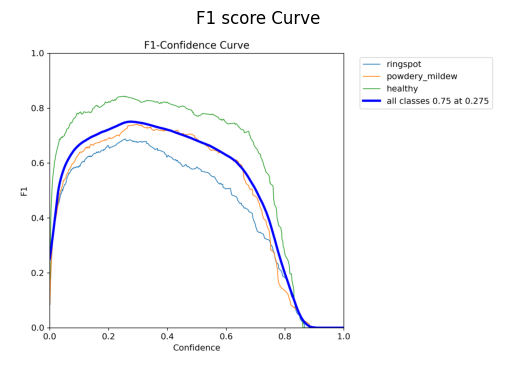

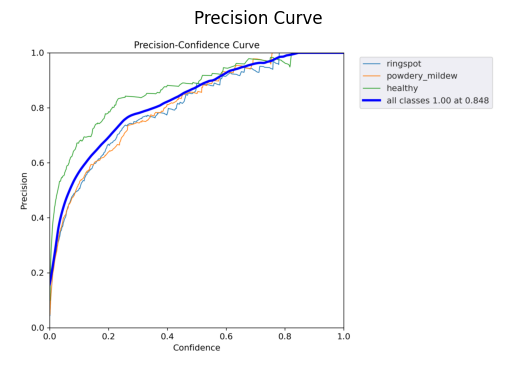

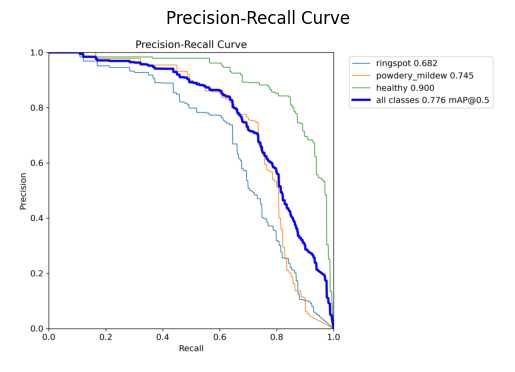

In [4]:
import matplotlib.pyplot as plt
import cv2
import os

val_results_folder = "/content/drive/My Drive/yolov5/runs/val/exp6"

# Load and display the f1 score curve

f1_curve_path = os.path.join(val_results_folder, "F1_curve.png")
if os.path.exists(f1_curve_path):
  img = cv2.imread(f1_curve_path)
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.title("F1 score Curve")
  plt.axis("off")
  plt.show()

# Load and display the precision curve

p_curve_path = os.path.join(val_results_folder, "P_curve.png")
if os.path.exists(p_curve_path):
  img = cv2.imread(p_curve_path)
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.title("Precision Curve")
  plt.axis("off")
  plt.show()

# Load and display the precision-recall curve

pr_curve_path = os.path.join(val_results_folder, "PR_curve.png")
if os.path.exists(pr_curve_path):
  img = cv2.imread(pr_curve_path)
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.title("Precision-Recall Curve")
  plt.axis("off")
  plt.show()

10. Tensorboard visualization

In [ ]:
# Visualize the results
%load_ext tensorboard
%tensorboard --logdir "/content/drive/My Drive/yolov5/runs/exp"

<IPython.core.display.Javascript object>

11. Detect the test image

In [ ]:
!python "/content/drive/My Drive/yolov5/detect.py" \
--weights "/content/drive/My Drive/yolov5/runs/exp6/weights/best.pt" \
--img 640 \
--conf 0.5 \
--source "/content/drive/My Drive/test_detect_images_exp6/test_pw.jpg" \
--project "/content/drive/My Drive/test_detect_images_exp6" \
--name results \
--exist-ok

detect: weights=['/content/drive/My Drive/yolov5/runs/exp6/weights/best.pt'], source=/content/drive/My Drive/test_detect_images_exp6/test_pw.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=/content/drive/My Drive/test_detect_images_exp6, name=results, exist_ok=True, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
fatal: cannot change to '/content/drive/My': No such file or directory
YOLOv5 🚀 2024-11-2 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/drive/My Drive/test_detect_images_exp6/test_pw.jpg: 640x352 1 powdery_mildew, 30.8ms
Sp

12. Show the detection results

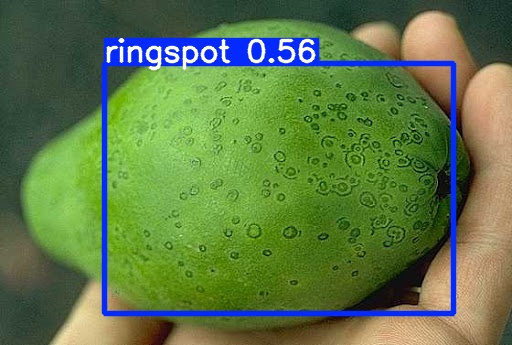

In [3]:
from IPython.display import Image, display

image_path = '/content/drive/My Drive/test_detect_images_exp6/results/ringspot_test.jpg'
display(Image(filename=image_path, width=640, height=640))

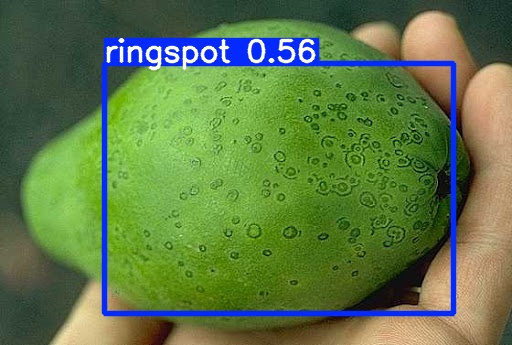

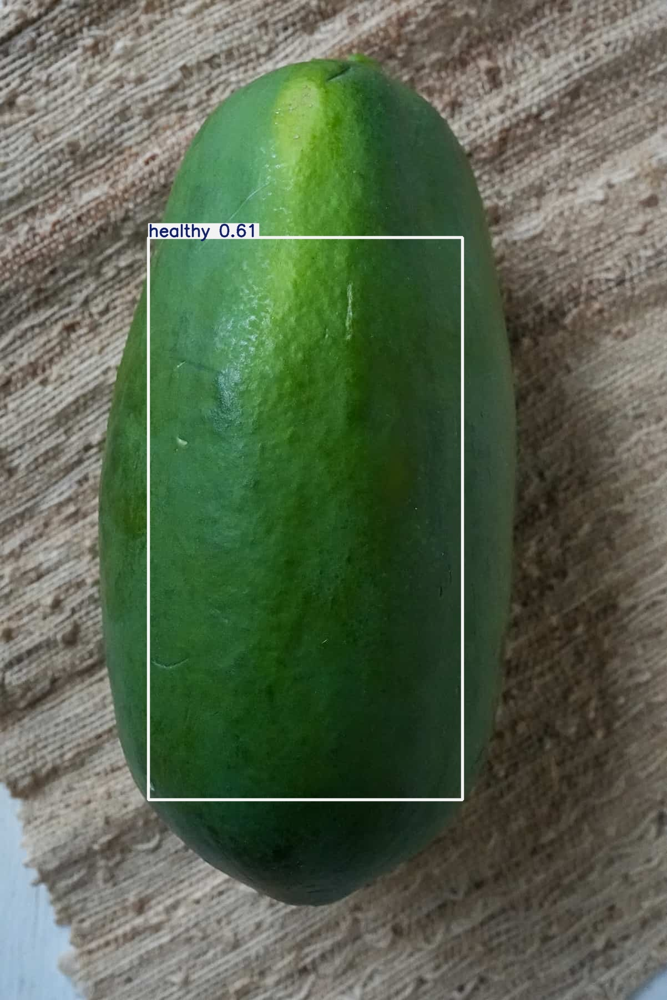

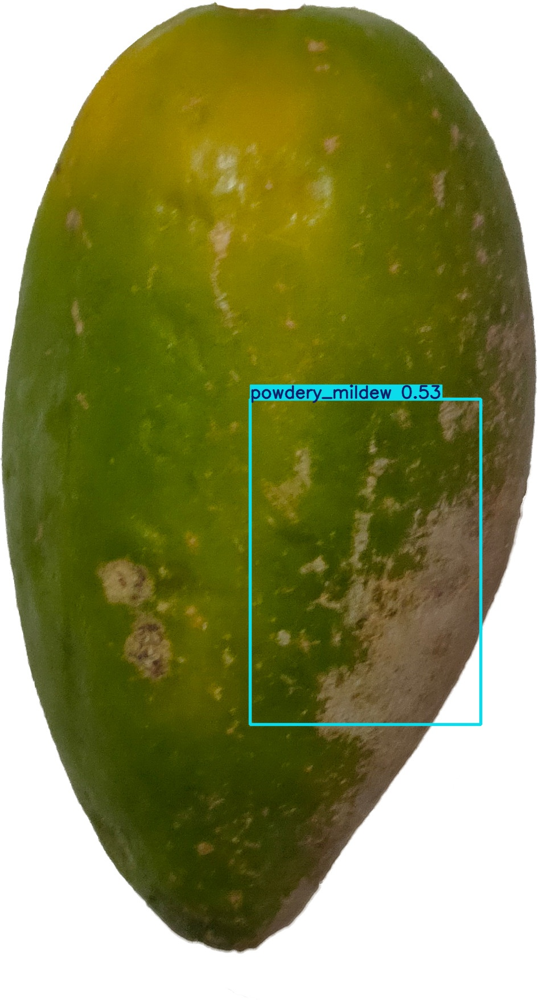

In [2]:
import os
from IPython.display import Image, display

image_folder = '/content/drive/My Drive/test_detect_images_exp6/results'

# Loop through all the images in the folder and display them
for image_name in os.listdir(image_folder):
    if image_name.endswith(('.jpg', '.jpeg', '.png')):
        image_path = os.path.join(image_folder, image_name)
        display(Image(filename=image_path, width=640, height=640))
